<a href="https://colab.research.google.com/github/OlegBEZb/assesment_preparation/blob/main/Bank%20marketing%20dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%%capture

!pip install scipy -U
!pip install auto-sklearn
!pip install pandas-profiling -U
!pip install MarkupSafe==2.0.1
!pip install category_encoders

In [1]:
# needed for auto-sklearn
import scipy
scipy.__version__

'1.7.3'

In [2]:
import sklearn
import category_encoders as ce

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import pandas as pd
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns', None)

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


The dataset [description](http://archive.ics.uci.edu/ml/datasets/Bank+Marketing).   
[First paper of 2011](https://core.ac.uk/download/pdf/55616194.pdf).   
[Second paper of 2014](https://core.ac.uk/download/pdf/55631291.pdf)

In [14]:
df = pd.read_csv('/content/bank_marketing_campaign.csv')
df.head()

,age,job,marital,education,default,housing,loan,balance,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,423.0,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,2868.0,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,1888.0,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,1113.0,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,451.0,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [15]:
df.shape

(41188, 22)

The task is valuable to assist managers in prioritizing and selecting the next customers to be contacted during bank
marketing campaigns.

In [16]:
target_col = 'y'

# EDA and Preprocessing

In [6]:
df.index.is_monotonic

True

In [17]:
df.rename(columns={'month': 'last_contact_month',
                   'contact': 'last_communication_type',
                   'day_of_week': 'last_contact_day_of_week',
                   'default': 'has_credit',
                   'housing': 'has_housing_loan',
                   'loan': 'has_personal_loan'}, inplace=True)

CAT_FEATURES = ['job', 'marital', 'education',
                'has_credit', 'has_housing_loan', 'has_personal_loan',
                'last_communication_type', 'last_contact_month', 
                'last_contact_day_of_week', 'poutcome']

## Profiling

In [9]:
from pandas_profiling import ProfileReport

In [10]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]


1.   Age is positively correlated with balance (that is happy to know)
2.   List item



In [11]:
df[target_col].value_counts(normalize=True)

no     0.887346
yes    0.112654
Name: y, dtype: float64

## Drop duplicates

In [12]:
df[df.duplicated(keep=False)]

,age,job,marital,education,has_credit,has_housing_loan,has_personal_loan,balance,last_communication_type,last_contact_month,last_contact_day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1265,39,blue-collar,married,basic.6y,no,no,no,909.0,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,909.0,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,3520.0,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,3520.0,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,5778.0,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,5778.0,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,950.0,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,950.0,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,1889.0,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,1889.0,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


Thanks to pandas profiling, we founs several rows completely duplicates. There is no need to keep them

In [18]:
df.drop_duplicates(inplace=True)
df.shape

(41176, 22)

In [19]:
assert df[df.duplicated(keep=False)].empty

## Missing values handling

From the description we know that some of the missing values were replaced with specific values

In [15]:
df.isna().any(axis=0)

age                         False
job                         False
marital                     False
education                   False
has_credit                  False
has_housing_loan            False
has_personal_loan           False
balance                     False
last_communication_type     False
last_contact_month          False
last_contact_day_of_week    False
duration                    False
campaign                    False
pdays                       False
previous                    False
poutcome                    False
emp.var.rate                False
cons.price.idx              False
cons.conf.idx               False
euribor3m                   False
nr.employed                 False
y                           False
dtype: bool

Usual nans are not presented. All existing nans are encoded into specific value

For *job, marital, education, default, housing, loan* columns the value unknown is fair and very difficult to predict. Moreover, unknown value sometimes is important on its own, for example, if the user doesn't want to share this information (regardless if it was asked or scraped).

pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric; 999 means client was not previously contacted). 

Let us check how severe is this problem

In [16]:
len(df[df['pdays'] == 999]) / len(df)

0.9632067223625412

Most of the users were not contacted before. We are going to split this column

In [20]:
df['contacted_before'] = df['pdays'] == 999
df['contacted_before'] = df['contacted_before'].map({True: 1, False: 0})
df.loc[df['pdays'] == 999, 'pdays'] = np.nan

In [21]:
df['contacted_before'].value_counts()

1    39661
0     1515
Name: contacted_before, dtype: int64

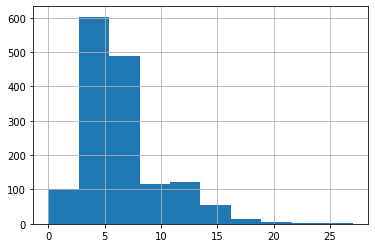

In [22]:
df['pdays'].hist()

## Target extraction, leaking features removal

11 - duration: last contact duration, in seconds (numeric). Important note: this attribute highly affects the output target (e.g., if duration=0 then y='no'). Yet, the duration is not known before a call is performed. Also, after the end of the call y is obviously known. Thus, this input should only be included for benchmark purposes and should be discarded if the intention is to have a realistic predictive model.

In [23]:
cols_to_drop = ['duration']

Within a campaign, the human agents execute phone calls to a list of clients to sell the deposit (outbound) or, if
meanwhile the client calls the contact-center for any other reason, he
is asked to subscribe the deposit (inbound). Thus, the result is a binary
unsuccessful or successful contact.

In [24]:
y = df[target_col].map({'no': 0, 'yes': 1})
X = df.drop([target_col] + cols_to_drop, axis=1)

In [25]:
y.value_counts()

0    36537
1     4639
Name: y, dtype: int64

In [26]:
y.value_counts(normalize=True)

0    0.887337
1    0.112663
Name: y, dtype: float64

Very similar to the values stated in https://core.ac.uk/download/pdf/55616194.pdf

## Feature engineering non-dependent on time

In [27]:
df['contacts_diff'] = df['campaign'] - df['previous']
df['poutcome_weighted'] = df['poutcome'].map({'failure': -1,
                                              'nonexistent': 0, 
                                              'success': 1}) * df['pdays']
df['contacts_per_conclusion'] = df['poutcome'].map({'failure': -1, 
                                                    'nonexistent': 0, 
                                                    'success': 1}) / (df['previous'] + 1e-6)

df['balance_log10'] = np.log(df['balance'] + 1e-6) / np.log(10)                                               

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


## Train-val-test split

According to the description, the data is "ordered by date (from May 2008 to November 2010)". This doesn't let us shuffle the data. 

But in the [first paper of 2011](https://core.ac.uk/download/pdf/55616194.pdf) "the whole dataset
was randomly divided into training (2/3) and test (1/3)
sets".   

In the [second paper of 2014](https://core.ac.uk/download/pdf/55631291.pdf) it was fixed: "For evaluation purposes, a time ordered split was initially performed, where the records were divided into training (four years)
and test data (one year). The training data is used for feature and model
selection and includes all contacts executed up to June 2012, in a total of
51,651 examples. The test data is used for measuring the prediction capabilities of the selected data-driven model, including the most recent
1293 contacts, from July 2012 to June 2013."

In [28]:
df['last_contact_month'].value_counts()

may    13767
jul     7169
aug     6176
jun     5318
nov     4100
apr     2631
oct      717
sep      570
mar      546
dec      182
Name: last_contact_month, dtype: int64

In [29]:
df['last_contact_month'] = df['last_contact_month'].map({'jan': 0,
                                                         'feb': 1,
                                                         'mar': 2,
                                                         'apr': 3,
                                                         'may': 4,
                                                         'jun': 5,
                                                         'jul': 6,
                                                         'aug': 7,
                                                         'sep': 8,
                                                         'oct': 9,
                                                         'nov': 10,
                                                         'dec': 11})

In [30]:
def collapse_sequences(ls):
    output_ls = []
    for elem in ls:
        if elem not in output_ls:
            output_ls.append(elem)
        else: # if this element already in the output list
            if output_ls[-1] != elem: # we check that this is a new sequence of this value
                output_ls.append(elem)
    return output_ls

In [31]:
print(collapse_sequences(df['last_contact_month'].values))

[4, 5, 6, 7, 9, 10, 11, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 2, 3, 4, 5, 6, 7, 8, 9, 10]


here we easily see 2.5 years. We never have anything in Jan, Feb

In [32]:
last_year_day_index = df[(df['last_contact_month'] == 11) & ((df['last_contact_month'].shift(-1) == 2))].index
df.loc[last_year_day_index]

,age,job,marital,education,has_credit,has_housing_loan,has_personal_loan,balance,last_communication_type,last_contact_month,last_contact_day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y,contacted_before,contacts_diff,poutcome_weighted,contacts_per_conclusion,balance_log10
27689,44,blue-collar,married,basic.4y,no,yes,yes,635.0,telephone,11,mon,119,1,NaN,0,nonexistent,-0.2,92.756,-45.9,3.053,5176.3,yes,1,1,NaN,0.000000,2.802774
39129,59,management,married,university.degree,no,yes,no,1358.0,cellular,11,thu,646,3,6.0,1,success,-3.0,92.713,-33.0,0.700,5023.5,no,0,2,6.0,0.999999,3.132900


In [33]:
df.loc[:last_year_day_index[0], 'last_contact_year'] = 2008
df.loc[last_year_day_index[0]+1: last_year_day_index[1], 'last_contact_year'] = 2009
df.loc[last_year_day_index[1]+1:, 'last_contact_year'] = 2010
df['last_contact_year'] = df['last_contact_year'].astype(int)

This may be shifted one year back as it's the prev campaign

In [34]:
df['year_mon'] = df[['last_contact_year', 'last_contact_month']].apply(lambda x: str(x['last_contact_year']) + '_' + str(x['last_contact_month']).zfill(2), axis=1)
df['year_mon']

0        2008_04
1        2008_04
2        2008_04
3        2008_04
4        2008_04
          ...   
41183    2010_10
41184    2010_10
41185    2010_10
41186    2010_10
41187    2010_10
Name: year_mon, Length: 41176, dtype: object

In [35]:
year_mon_list = df['year_mon'].unique()
values = [df[df['year_mon'] == year_mon][target_col].value_counts(normalize=True).values for year_mon in year_mon_list]
label_distribs = np.array(values)
label_distribs.shape

(26, 2)

In [36]:
def plot_value_counts(distribs, xticks_list=['Train', 'Val', 'Test'], size=(15, 6)):
    x = np.arange(distribs.shape[0])
    width = 0.2
    
    y0 = distribs[:, 0]
    y1 = distribs[:, 1]

    plt.figure(figsize=size)
    plt.bar(x-0.2, y0, width, color='tab:blue')
    plt.bar(x, y1, width, color='tab:red')
    plt.xticks(x, xticks_list, rotation=45)
    plt.xlabel("Folds")
    plt.ylabel("Ratio")
    plt.legend(["deposit: no", "deposit: yes"])
    plt.title('Labed distriburion per fold')
    plt.show()

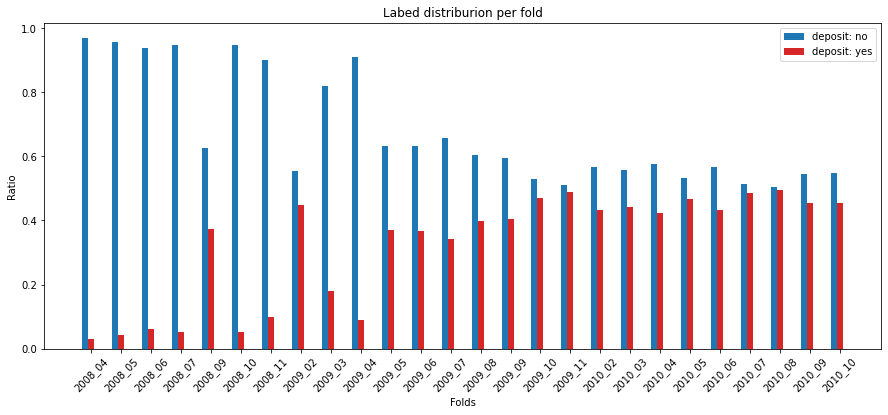

In [37]:
plot_value_counts(label_distribs, xticks_list=year_mon_list, size=(15, 6))

For the fair time-series split (which is essential) this is a very bad sign. The balance of the dataset changes along the timeline. This will not be such severe if we split with shuffle but it's unfair

In [38]:
print(collapse_sequences(df['last_contact_day_of_week']))

['mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'wed', 'thu', 'fri', 'mon', 'wed', 'thu', 'fri', 'mon', 'tue', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue', 'wed', 'thu', 'fri', 'mon', 'tue'

Analysing the distribution over the days, it will be possible to fill the original dates. This gives a very deep opportinity to calculate various time-related features

We do such a split without grouping into months as we rely on the sorting

In [39]:
from sklearn.model_selection import train_test_split

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.10, shuffle=False)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, 
                                                  test_size=len(y_test)*3, # needed for rebalancing
                                                  shuffle=False)

X_train.shape, X_val.shape, X_test.shape

((24704, 21), (12354, 21), (4118, 21))

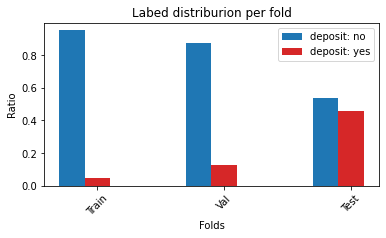

In [40]:
values = [df.value_counts(normalize=True).values for df in [y_train, y_val, y_test]]
label_distribs = np.array(values)

plot_value_counts(label_distribs, size=(6, 3))

In [41]:
y_val.value_counts()

0    10795
1     1559
Name: y, dtype: int64

In [42]:
neg2pos_test_ratio = len(y_test[y_test == 0]) / len(y_test[y_test == 1])
neg2pos_test_ratio

1.1765327695560253

In [43]:
y_val_keep = y_val[y_val == 0].sample(int(neg2pos_test_ratio*len(y_val[y_val == 1])))
y_val = y_val.loc[(y_val_keep.index).union(y_val[y_val==1].index)]
X_val = X_val.loc[y_val.index]

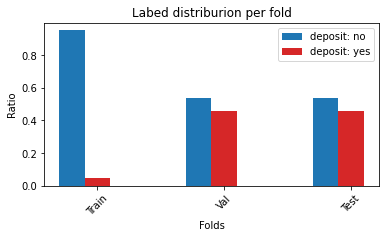

In [44]:
values = [fold_df.value_counts(normalize=True).values for fold_df in [y_train, y_val, y_test]]
label_distribs = np.array(values)
plot_value_counts(label_distribs, size=(6, 3))

Now we can evaluate our algorithms in a bit more stable manner

In [45]:
[fold_df.value_counts(normalize=False).values for fold_df in [y_train, y_val, y_test]]

[array([23516,  1188]), array([1834, 1559]), array([2226, 1892])]

In [46]:
assert X_train.index.is_monotonic_increasing
assert X_val.index.is_monotonic_increasing
assert X_test.index.is_monotonic_increasing

In [47]:
assert X_train.index.intersection(X_val.index).empty
assert X_train.index.intersection(X_test.index).empty
assert X_val.index.intersection(X_test.index).empty

In [48]:
X_train.shape, X_val.shape, X_test.shape

((24704, 21), (3393, 21), (4118, 21))

# Evaluation

Selecting between F1, ROC AUC, and PR AUC.  

The dataset is heavily imbalanced we mostly mostly care about the positive class -> ROC AUC is rejected.  The additional reason to go with F1 (or Fbeta) is that these metrics are easier to interpret and communicate to business stakeholders.  

To provide some sort of comparison with the original papers, ROC AUC may be included but not treated as target metric

In [49]:
def eval(y_test, y_pred):
    clf_report = classification_report(y_test, y_pred, zero_division=0)

    print(clf_report)

    conf_matrix = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=np.unique(y_test))
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.grid(False)
    disp.plot(ax=ax)

# Modeling

## Baselines

### Majority baseline

              precision    recall  f1-score   support

           0       0.54      1.00      0.70      2226
           1       0.00      0.00      0.00      1892

    accuracy                           0.54      4118
   macro avg       0.27      0.50      0.35      4118
weighted avg       0.29      0.54      0.38      4118



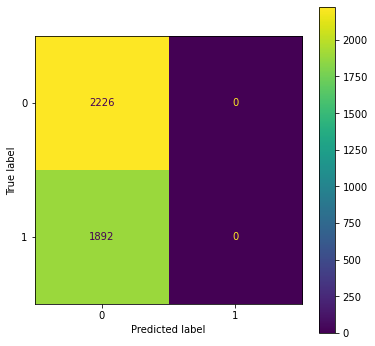

In [46]:
eval(y_test, [0] * len(y_test))

### Random baseline

              precision    recall  f1-score   support

           0       0.55      0.51      0.53      2226
           1       0.47      0.50      0.48      1892

    accuracy                           0.51      4118
   macro avg       0.51      0.51      0.51      4118
weighted avg       0.51      0.51      0.51      4118



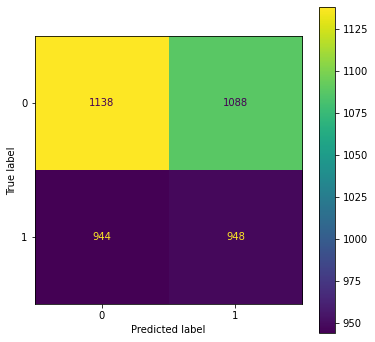

In [47]:
eval(y_test, np.random.choice([0, 1], size=len(y_test)))

### Log reg with dummy features baseline

In [51]:
nan_cols = X_train.columns[X_train.isna().any(axis=0)].tolist()
nan_cols

['pdays']

In [52]:
# Create correlation matrix
corr_matrix = X_train.corr()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.style.background_gradient(cmap='coolwarm')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """
/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:2813: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(gmap) if vmin is None else vmin
/usr/local/lib/python3.7/dist-packages/pandas/io/formats/style.py:2814: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(gmap) if vmax is None else vmax


,age,balance,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,contacted_before
age,nan,0.151468,0.010459,-0.698961,0.015908,-0.038338,-0.045104,0.068196,-0.042844,-0.021614,-0.001096
balance,nan,nan,-0.006338,-0.841124,0.022547,-0.022923,-0.011893,0.019771,-0.025991,-0.012169,-0.025759
campaign,nan,nan,nan,0.125000,-0.032051,0.114433,0.062551,-0.079411,0.100351,0.102536,0.007404
pdays,nan,nan,nan,nan,nan,nan,nan,nan,0.790569,nan,nan
previous,nan,nan,nan,nan,nan,-0.363357,-0.152278,-0.067668,-0.406488,-0.082206,-0.214294
emp.var.rate,nan,nan,nan,nan,nan,nan,0.235923,-0.172703,0.925817,0.665470,0.077865
cons.price.idx,nan,nan,nan,nan,nan,nan,nan,-0.426958,0.200589,-0.040267,0.033055
cons.conf.idx,nan,nan,nan,nan,nan,nan,nan,nan,-0.047868,-0.559713,0.014628
euribor3m,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.519970,0.087312
nr.employed,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.017616


In [86]:
# Find features with correlation greater than threshold
corr_cols = [column for column in upper.columns if any(abs(upper[column]) > 0.7)]
corr_cols

['pdays', 'euribor3m']

In [87]:
enc = ce.OneHotEncoder(cols=CAT_FEATURES, 
                       use_cat_names=True)

X_train_val_enc = enc.fit_transform(X_train_val.drop(nan_cols+corr_cols, axis=1))
X_train_val_enc.head(3)

,age,job_housemaid,job_services,job_admin.,job_blue-collar,job_technician,job_retired,job_management,job_unemployed,job_self-employed,job_unknown,job_entrepreneur,job_student,marital_married,marital_single,marital_divorced,marital_unknown,education_basic.4y,education_high.school,education_basic.6y,education_basic.9y,education_professional.course,education_unknown,education_university.degree,education_illiterate,has_credit_no,has_credit_unknown,has_credit_yes,has_housing_loan_no,has_housing_loan_yes,has_housing_loan_unknown,has_personal_loan_no,has_personal_loan_yes,has_personal_loan_unknown,balance,last_communication_type_telephone,last_communication_type_cellular,last_contact_month_may,last_contact_month_jun,last_contact_month_jul,last_contact_month_aug,last_contact_month_oct,last_contact_month_nov,last_contact_month_dec,last_contact_month_mar,last_contact_month_apr,last_contact_day_of_week_mon,last_contact_day_of_week_tue,last_contact_day_of_week_wed,last_contact_day_of_week_thu,last_contact_day_of_week_fri,campaign,previous,poutcome_nonexistent,poutcome_failure,poutcome_success,emp.var.rate,cons.price.idx,cons.conf.idx,nr.employed,contacted_before
0,56,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,423.0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1.1,93.994,-36.4,5191.0,1
1,57,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,2868.0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1.1,93.994,-36.4,5191.0,1
2,37,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,1888.0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1.1,93.994,-36.4,5191.0,1


In [88]:
X_test_enc = enc.transform(X_test.drop(nan_cols+corr_cols, axis=1))
X_test_enc.shape

(4118, 61)

In [89]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

log_reg_baseline = make_pipeline(StandardScaler(), LogisticRegression(C=1.))
log_reg_baseline.fit(X_train_val_enc, y_train_val)
log_reg_baseline_preds = log_reg_baseline.predict(X_test_enc)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


              precision    recall  f1-score   support

           0       0.66      0.59      0.62      2226
           1       0.57      0.65      0.61      1892

    accuracy                           0.62      4118
   macro avg       0.62      0.62      0.62      4118
weighted avg       0.62      0.62      0.62      4118



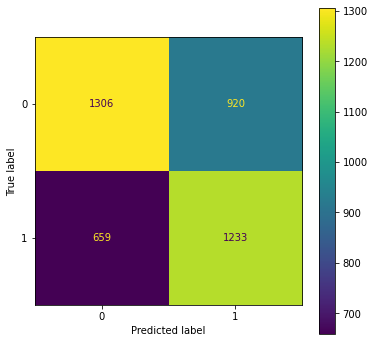

In [90]:
eval(y_test, log_reg_baseline_preds)

In [101]:
importance = log_reg_baseline.steps[-1][-1].coef_[0]
pd.DataFrame({'feature': X_train_val_enc.columns, 'importance': importance}).sort_values('importance', 
                                                                                         ascending=False).head(10)

,feature,importance
39,last_contact_month_jul,0.163997
38,last_contact_month_jun,0.155923
58,cons.conf.idx,0.148692
41,last_contact_month_oct,0.144154
44,last_contact_month_mar,0.134241
36,last_communication_type_cellular,0.101836
6,job_retired,0.075489
53,poutcome_nonexistent,0.075371
45,last_contact_month_apr,0.059892
55,poutcome_success,0.056569


## CatBoost

In [ ]:
%%capture
!pip install catboost

In [76]:
import catboost
from catboost import CatBoostClassifier, Pool

In [77]:
train_pool = Pool(data=X_train, 
                  label=y_train,
                  cat_features=CAT_FEATURES,
                  )

val_pool = Pool(data=X_val, 
                  label=y_val,
                  cat_features=CAT_FEATURES,
                  )

test_pool = Pool(data=X_test, 
                  label=y_test,
                  cat_features=CAT_FEATURES,
                  )

In [81]:
params = {
    'iterations': 300,
    'custom_metric': ['F1'], 
    'early_stopping_rounds': 100,
    'use_best_model': True,
    'metric_period': 10,
}

model = CatBoostClassifier(**params)
model.fit(train_pool, eval_set=val_pool, plot=False, verbose_eval=True)

Learning rate set to 0.118134


0:	learn: 0.5453390	test: 0.6771567	best: 0.6771567 (0)	total: 259ms	remaining: 1m 17s
10:	learn: 0.2047094	test: 1.0523762	best: 0.6771567 (0)	total: 1.14s	remaining: 30s
20:	learn: 0.1886089	test: 1.1128644	best: 0.6771567 (0)	total: 1.74s	remaining: 23.1s
30:	learn: 0.1855369	test: 1.0697728	best: 0.6771567 (0)	total: 2.69s	remaining: 23.3s
40:	learn: 0.1844478	test: 1.0903312	best: 0.6771567 (0)	total: 3.62s	remaining: 22.9s
50:	learn: 0.1836507	test: 1.1162852	best: 0.6771567 (0)	total: 4.66s	remaining: 22.7s
60:	learn: 0.1830858	test: 1.1473709	best: 0.6771567 (0)	total: 5.27s	remaining: 20.7s
70:	learn: 0.1825107	test: 1.1388659	best: 0.6771567 (0)	total: 5.78s	remaining: 18.6s
80:	learn: 0.1818565	test: 1.1432331	best: 0.6771567 (0)	total: 6.24s	remaining: 16.9s
90:	learn: 0.1812793	test: 1.1375465	best: 0.6771567 (0)	total: 6.73s	remaining: 15.5s
100:	learn: 0.1803388	test: 1.1866341	best: 0.6771567 (0)	total: 7.31s	remaining: 14.4s
Stopped by overfitting detector  (100 iterat

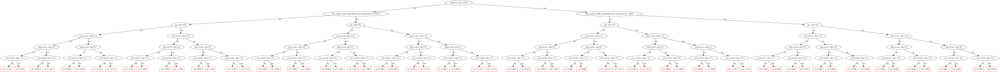

In [82]:
model.plot_tree(
    tree_idx=0,
    pool=val_pool
)

              precision    recall  f1-score   support

           0       0.57      0.97      0.72      1834
           1       0.80      0.14      0.24      1559

    accuracy                           0.59      3393
   macro avg       0.69      0.56      0.48      3393
weighted avg       0.68      0.59      0.50      3393



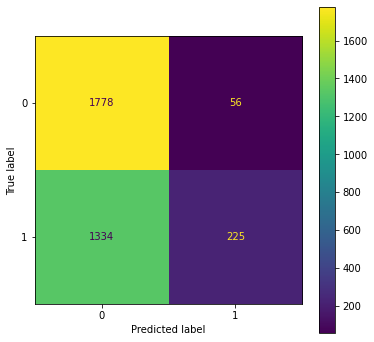

In [84]:
predictions = model.predict(val_pool)
eval(y_val, predictions)

              precision    recall  f1-score   support

           0       0.53      0.44      0.48      2226
           1       0.45      0.54      0.49      1892

    accuracy                           0.49      4118
   macro avg       0.49      0.49      0.49      4118
weighted avg       0.49      0.49      0.49      4118



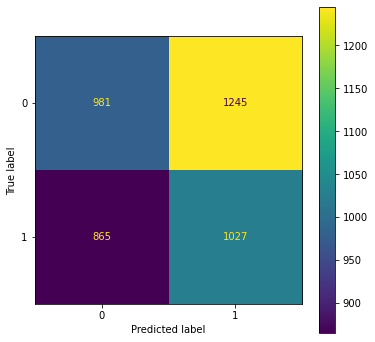

In [113]:
predictions = model.predict(test_pool)
eval(y_test, predictions)

# SHAP importances

In [103]:
%%capture
!pip install shap

In [110]:
import shap
shap.initjs()

explainer = shap.Explainer(model)
shap_values = explainer(X_val)

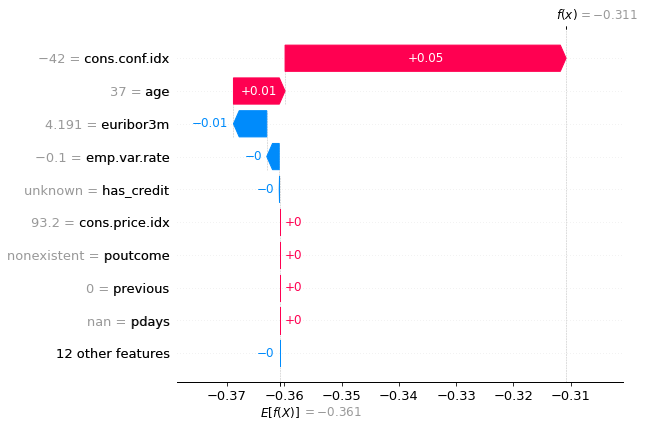

In [105]:
shap.plots.waterfall(shap_values[0])

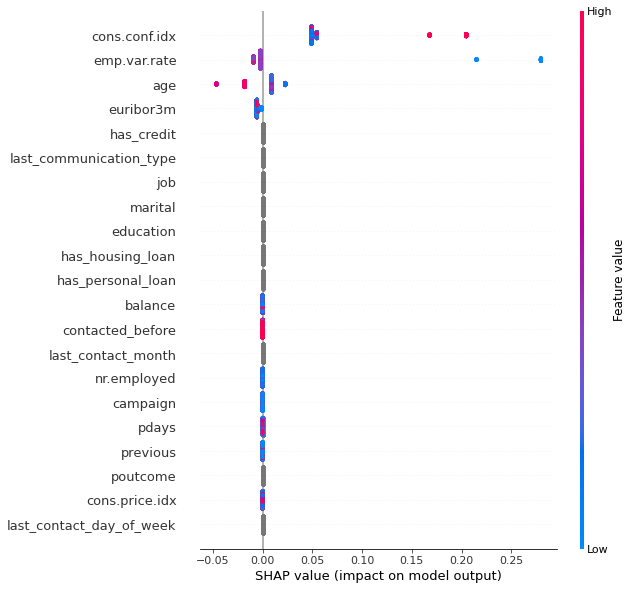

In [106]:
# summarize the effects of all the features
shap.plots.beeswarm(shap_values, max_display=50)

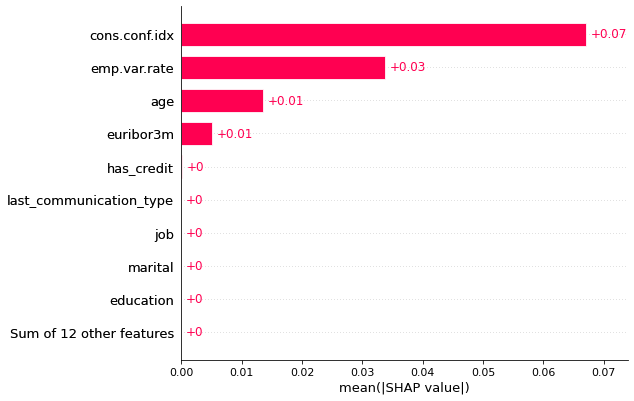

In [108]:
shap.plots.bar(shap_values, max_display=10)

# Results

In [123]:
X_test['pred'] = predictions


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [124]:
X_test['pred'].value_counts()

1    2272
0    1846
Name: pred, dtype: int64

## Channels

In [132]:
X_test.groupby(['contacted_before'])['pred'].value_counts(normalize=True)

contacted_before  pred
0                 1       0.554600
                  0       0.445400
1                 1       0.550592
                  0       0.449408
Name: pred, dtype: float64

independent of this

In [131]:
X_test.groupby(['last_communication_type'])['pred'].value_counts(normalize=True)

last_communication_type  pred
cellular                 1       0.540773
                         0       0.459227
telephone                1       0.613162
                         0       0.386838
Name: pred, dtype: float64

telephone is more promising

In [133]:
X_test.groupby(['marital'])['pred'].value_counts(normalize=True)

marital   pred
divorced  0       0.727711
          1       0.272289
married   0       0.601734
          1       0.398266
single    1       0.852295
          0       0.147705
unknown   1       0.625000
          0       0.375000
Name: pred, dtype: float64

singles are the target

In [134]:
X_test.groupby(['has_personal_loan'])['pred'].value_counts(normalize=True)

has_personal_loan  pred
no                 1       0.549854
                   0       0.450146
unknown            1       0.561905
                   0       0.438095
yes                1       0.560892
                   0       0.439108
Name: pred, dtype: float64

independent

# Profit evaluation

Assume that every agreed customer puts half of their balance to deposit. Let the interest rate for the US be 2% and the lending percent 5% (2008). So the bank has a profit of 3 percents of the deposit per year.  

The users which may potentially agree with the advertisement but were not called are the money lose for the company.  

So our evaluation framework is the following. We have a limited amount of calls during the campaign. Assume, 100 or 1000. And we have to select the users to be called and advertised. The total score of the model will be calculated and the profit from the users agreed and phoned minus the users agreed but not phoned. The selected models may be compared to the random baseline in terms of money profit.

An example of calculating the year profit is presented below

In [138]:
sum(X_test[X_test['pred'] == 1]['balance'] *0.5 * 0.03)

46175.69999999998

# Saving a notebook to HTML from Colab

https://stackoverflow.com/questions/53460051/convert-ipynb-notebook-to-html-in-google-colab

In [141]:
%%shell
jupyter nbconvert --to html /content/notebook.ipynb

[NbConvertApp] Converting notebook /content/notebook.ipynb to html
[NbConvertApp] Writing 10136571 bytes to /content/notebook.html
